In [ ]:

import os
import sys
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
import torch


BASE_PATH = "D:\\Sk Khaleel\\YZU\\Pattern Recognition\\Final Project\\Dataset Several\\severstal-steel-defect-detection (1)\\"
CSV_PATH = os.path.join(BASE_PATH, "train.csv")
TRAIN_IMG_DIR = os.path.join(BASE_PATH, "train_images")
TEST_IMG_DIR  = os.path.join(BASE_PATH, "test_images")


IMG_SIZE = (256, 256)  
BATCH_SIZE = 4
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("CSV path:", CSV_PATH)
print("Train images folder:", TRAIN_IMG_DIR)
print("Test images folder:", TEST_IMG_DIR)
print("Device:", DEVICE)


CSV path: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train.csv
Train images folder: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images
Test images folder: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\test_images
Device: cuda


In [ ]:

df = pd.read_csv(CSV_PATH)
print("COLUMNS:", df.columns.tolist())
print("\nFIRST 8 ROWS:")
display(df.head(8))


COLUMNS: ['ImageId', 'ClassId', 'EncodedPixels']

FIRST 8 ROWS:


,ImageId,ClassId,EncodedPixels
0,0002cc93b.jpg,1,29102 12 29346 24 29602 24 29858 24 30114 24 3...
1,0007a71bf.jpg,3,18661 28 18863 82 19091 110 19347 110 19603 11...
2,000a4bcdd.jpg,1,37607 3 37858 8 38108 14 38359 20 38610 25 388...
3,000f6bf48.jpg,4,131973 1 132228 4 132483 6 132738 8 132993 11 ...
4,0014fce06.jpg,3,229501 11 229741 33 229981 55 230221 77 230468...
5,0025bde0c.jpg,3,8458 14 8707 35 8963 48 9219 71 9475 88 9731 8...
6,0025bde0c.jpg,4,315139 8 315395 15 315651 16 315906 17 316162 ...
7,002af848d.jpg,4,290800 6 291055 13 291311 15 291566 18 291822 ...


In [ ]:

import numpy as np
import pandas as pd

def rle_decode(mask_rle, shape=(1600, 256)):
    """Decode RLE (string) to HxW binary mask. shape is (width, height) for decoding."""
    if pd.isna(mask_rle):
        return np.zeros((shape[1], shape[0]), dtype=np.uint8)
    s = str(mask_rle).strip().split()
    starts = np.array(s[0::2], dtype=int)
    lengths = np.array(s[1::2], dtype=int)
    starts -= 1
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for st, le in zip(starts, lengths):
        img[st:st+le] = 1
    return img.reshape((shape[0], shape[1]), order='F').T  # H x W

def ensure_jpg(name):
    """Ensure filename has extension; returns basename (with extension)."""
    if not isinstance(name, str):
        name = str(name)
    if name.lower().endswith(('.jpg','.jpeg','.png')):
        return name
    return name + ".jpg"


In [ ]:

def build_image_mask_map(csv_path):
    df = pd.read_csv(csv_path)
    cols = [c.lower() for c in df.columns]
    mapping = {}


    if 'imageid_classid' in cols and 'encodedpixels' in cols:
        full_col = [c for c in df.columns if c.lower()=='imageid_classid'][0]
        rle_col  = [c for c in df.columns if c.lower()=='encodedpixels'][0]
        df['ImageId'] = df[full_col].apply(lambda x: x.split('_')[0])
        grouped = df.groupby('ImageId')[rle_col].apply(list).to_dict()
        for img, rle_list in tqdm(grouped.items(), desc="building masks"):
            fname = ensure_jpg(img)
            combined = None
            for r in rle_list:
                if pd.isna(r): continue
                m = rle_decode(r)
                combined = m if combined is None else np.logical_or(combined, m)
            if combined is None:
                combined = np.zeros((256,1600), dtype=np.uint8)
            mapping[fname] = combined.astype(np.uint8)
        return mapping

    if 'imageid' in cols and 'encodedpixels' in cols:
        img_col = [c for c in df.columns if c.lower()=='imageid'][0]
        rle_col = [c for c in df.columns if c.lower()=='encodedpixels'][0]
        if df[img_col].duplicated().any():
            grouped = df.groupby(img_col)[rle_col].apply(list).to_dict()
            for img, rle_list in tqdm(grouped.items(), desc="building masks"):
                fname = ensure_jpg(img)
                combined = None
                for r in rle_list:
                    if pd.isna(r): continue
                    m = rle_decode(r)
                    combined = m if combined is None else np.logical_or(combined, m)
                if combined is None:
                    combined = np.zeros((256,1600), dtype=np.uint8)
                mapping[fname] = combined.astype(np.uint8)
        else:
            for _, row in df.iterrows():
                fname = ensure_jpg(row[img_col])
                r = row[rle_col]
                mapping[fname] = (rle_decode(r) if not pd.isna(r) else np.zeros((256,1600), dtype=np.uint8)).astype(np.uint8)
        return mapping

    
    possible_rle = [c for c in df.columns if 'encoded' in c.lower() or 'pixel' in c.lower() or 'rle' in c.lower()]
    possible_img = [c for c in df.columns if 'image' in c.lower() or 'id' in c.lower()]
    if possible_rle and possible_img:
        img_col = possible_img[0]; rle_col = possible_rle[0]
        print(f"[fallback] using img_col='{img_col}', rle_col='{rle_col}'")
        if df[img_col].duplicated().any():
            grouped = df.groupby(img_col)[rle_col].apply(list).to_dict()
            for img, rle_list in tqdm(grouped.items(), desc="building masks"):
                fname = ensure_jpg(img)
                combined = None
                for r in rle_list:
                    if pd.isna(r): continue
                    m = rle_decode(r)
                    combined = m if combined is None else np.logical_or(combined, m)
                if combined is None:
                    combined = np.zeros((256,1600), dtype=np.uint8)
                mapping[fname] = combined.astype(np.uint8)
        else:
            for _, row in df.iterrows():
                fname = ensure_jpg(row[img_col])
                r = row[rle_col]
                mapping[fname] = (rle_decode(r) if not pd.isna(r) else np.zeros((256,1600), dtype=np.uint8)).astype(np.uint8)
        return mapping

    
    raise ValueError("Unrecognized CSV format. Columns: " + str(df.columns.tolist()))


mapping = build_image_mask_map(CSV_PATH)
print("Built mapping for", len(mapping), "images. Sample keys:", list(mapping.keys())[:5])


building masks: 100%|██████████| 6666/6666 [00:02<00:00, 2566.24it/s]

Built mapping for 6666 images. Sample keys: ['0002cc93b.jpg', '0007a71bf.jpg', '000a4bcdd.jpg', '000f6bf48.jpg', '0014fce06.jpg']


In [ ]:

from torch.utils.data import Dataset
import torch

class SeverstalDatasetPIL(Dataset):
    def __init__(self, img_dir, mapping, img_size=(256,256)):
        self.img_dir = img_dir
        self.mapping = mapping
        self.ids = list(mapping.keys())
        self.img_size = img_size

    def __len__(self): return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        img_path = os.path.join(self.img_dir, img_id)
       
        if not os.path.exists(img_path):
            base = os.path.splitext(img_id)[0]
            found = False
            for ext in ('.jpg','.jpeg','.png'):
                p = os.path.join(self.img_dir, base + ext)
                if os.path.exists(p):
                    img_path = p
                    found = True
                    break
            if not found:
                raise FileNotFoundError(f"Image not found: tried {img_path}")

        img = Image.open(img_path).convert('RGB')
        img_resized = img.resize((self.img_size[1], self.img_size[0]))
        img_arr = np.asarray(img_resized).astype(np.float32)/255.0
        img_tensor = torch.tensor(np.transpose(img_arr, (2,0,1)).astype(np.float32))

        mask_orig = self.mapping[os.path.basename(img_path)]
        mask_resized = Image.fromarray(mask_orig).resize((self.img_size[1], self.img_size[0]))
        mask_arr = (np.asarray(mask_resized) > 0).astype(np.float32)
        mask_tensor = torch.tensor(mask_arr[np.newaxis,:,:].astype(np.float32))

        return img_tensor, mask_tensor, os.path.basename(img_path)


ds = SeverstalDatasetPIL(TRAIN_IMG_DIR, mapping, img_size=IMG_SIZE)
print("Dataset size:", len(ds))
img_t, mask_t, sample_id = ds[0]
print("sample id:", sample_id, "img shape:", img_t.shape, "mask shape:", mask_t.shape)


Dataset size: 6666
sample id: 0002cc93b.jpg img shape: torch.Size([3, 256, 256]) mask shape: torch.Size([1, 256, 256])


In [ ]:
# U-Net model 

import torch.nn as nn
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.ReLU(inplace=True),
        )
    def forward(self,x): return self.net(x)

class UNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1):
        super().__init__()
        self.down1 = DoubleConv(in_ch,64); self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(64,128); self.pool2 = nn.MaxPool2d(2)
        self.down3 = DoubleConv(128,256); self.pool3 = nn.MaxPool2d(2)
        self.bridge = DoubleConv(256,512)
        self.up3 = nn.ConvTranspose2d(512,256,2,stride=2); self.conv3 = DoubleConv(512,256)
        self.up2 = nn.ConvTranspose2d(256,128,2,stride=2); self.conv2 = DoubleConv(256,128)
        self.up1 = nn.ConvTranspose2d(128,64,2,stride=2); self.conv1 = DoubleConv(128,64)
        self.out = nn.Conv2d(64,out_ch,1)
    def forward(self,x):
        d1 = self.down1(x); p1 = self.pool1(d1)
        d2 = self.down2(p1); p2 = self.pool2(d2)
        d3 = self.down3(p2); p3 = self.pool3(d3)
        b  = self.bridge(p3)
        u3 = self.up3(b); u3 = torch.cat([u3, d3], dim=1); c3 = self.conv3(u3)
        u2 = self.up2(c3); u2 = torch.cat([u2, d2], dim=1); c2 = self.conv2(u2)
        u1 = self.up1(c2); u1 = torch.cat([u1, d1], dim=1); c1 = self.conv1(u1)
        return torch.sigmoid(self.out(c1))


model = UNet().to(DEVICE)
print(model)


UNet(
  (down1): DoubleConv(
    (net): Sequential(
      (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down2): DoubleConv(
    (net): Sequential(
      (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down3): DoubleConv(
    (net): Sequential(
      (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU(inplace=True)
      (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU(inplace=True)
    )
  )
  (poo

In [ ]:
#  Training loop 
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim

EPOCHS = 1   # change to 3+ for full training
loader = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
criterion = nn.BCELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)

model.train()
for epoch in range(EPOCHS):
    running_loss = 0.0
    for i, (imgs, masks, ids) in enumerate(tqdm(loader)):
        imgs = imgs.to(DEVICE)
        masks = masks.to(DEVICE)
        preds = model(imgs)
        loss = criterion(preds, masks)
        optimizer.zero_grad(); loss.backward(); optimizer.step()
        running_loss += loss.item()
        if i % 20 == 0:
            print(f"Epoch {epoch+1} Batch {i} Loss {loss.item():.4f}")
    print(f"Epoch {epoch+1} finished. Avg loss: {running_loss/len(loader):.4f}")


  0%|          | 1/1667 [00:00<25:28,  1.09it/s]

Epoch 1 Batch 0 Loss 0.6488


  1%|▏         | 21/1667 [00:07<09:11,  2.98it/s]

Epoch 1 Batch 20 Loss 0.4615


  2%|▏         | 41/1667 [00:14<09:03,  2.99it/s]

Epoch 1 Batch 40 Loss 0.1661


  4%|▎         | 61/1667 [00:20<08:58,  2.98it/s]

Epoch 1 Batch 60 Loss 0.6045


  5%|▍         | 81/1667 [00:27<08:52,  2.98it/s]

Epoch 1 Batch 80 Loss 0.3546


  6%|▌         | 101/1667 [00:34<08:49,  2.96it/s]

Epoch 1 Batch 100 Loss 0.3738


  7%|▋         | 121/1667 [00:41<08:38,  2.98it/s]

Epoch 1 Batch 120 Loss 0.1962


  8%|▊         | 141/1667 [00:47<08:40,  2.93it/s]

Epoch 1 Batch 140 Loss 0.4018


 10%|▉         | 161/1667 [00:54<08:31,  2.94it/s]

Epoch 1 Batch 160 Loss 0.3975


 11%|█         | 181/1667 [01:01<08:19,  2.97it/s]

Epoch 1 Batch 180 Loss 0.2577


 12%|█▏        | 201/1667 [01:08<08:16,  2.95it/s]

Epoch 1 Batch 200 Loss 0.2579


 13%|█▎        | 221/1667 [01:14<08:09,  2.96it/s]

Epoch 1 Batch 220 Loss 0.4021


 14%|█▍        | 241/1667 [01:21<08:06,  2.93it/s]

Epoch 1 Batch 240 Loss 0.3025


 16%|█▌        | 261/1667 [01:28<08:00,  2.93it/s]

Epoch 1 Batch 260 Loss 0.3182


 17%|█▋        | 281/1667 [01:35<07:49,  2.95it/s]

Epoch 1 Batch 280 Loss 0.2556


 18%|█▊        | 301/1667 [01:42<07:45,  2.93it/s]

Epoch 1 Batch 300 Loss 0.4520


 19%|█▉        | 321/1667 [01:49<07:37,  2.94it/s]

Epoch 1 Batch 320 Loss 0.0967


 20%|██        | 341/1667 [01:55<07:24,  2.99it/s]

Epoch 1 Batch 340 Loss 0.2096


 22%|██▏       | 361/1667 [02:02<07:20,  2.96it/s]

Epoch 1 Batch 360 Loss 0.2336


 23%|██▎       | 381/1667 [02:09<07:12,  2.97it/s]

Epoch 1 Batch 380 Loss 0.1465


 24%|██▍       | 401/1667 [02:15<07:06,  2.97it/s]

Epoch 1 Batch 400 Loss 0.1422


 25%|██▌       | 421/1667 [02:22<07:02,  2.95it/s]

Epoch 1 Batch 420 Loss 0.1464


 26%|██▋       | 441/1667 [02:29<06:55,  2.95it/s]

Epoch 1 Batch 440 Loss 0.1563


 28%|██▊       | 461/1667 [02:36<06:46,  2.96it/s]

Epoch 1 Batch 460 Loss 0.2407


 29%|██▉       | 481/1667 [02:42<06:38,  2.98it/s]

Epoch 1 Batch 480 Loss 0.1920


 30%|███       | 501/1667 [02:49<06:33,  2.97it/s]

Epoch 1 Batch 500 Loss 0.2539


 31%|███▏      | 521/1667 [02:56<06:26,  2.97it/s]

Epoch 1 Batch 520 Loss 0.2957


 32%|███▏      | 541/1667 [03:03<06:19,  2.97it/s]

Epoch 1 Batch 540 Loss 0.0971


 34%|███▎      | 561/1667 [03:09<06:13,  2.96it/s]

Epoch 1 Batch 560 Loss 0.1900


 35%|███▍      | 581/1667 [03:16<06:05,  2.98it/s]

Epoch 1 Batch 580 Loss 0.2263


 36%|███▌      | 601/1667 [03:23<06:01,  2.95it/s]

Epoch 1 Batch 600 Loss 0.7834


 37%|███▋      | 621/1667 [03:30<05:52,  2.97it/s]

Epoch 1 Batch 620 Loss 0.1212


 38%|███▊      | 641/1667 [03:36<05:46,  2.96it/s]

Epoch 1 Batch 640 Loss 0.2544


 40%|███▉      | 661/1667 [03:43<05:41,  2.95it/s]

Epoch 1 Batch 660 Loss 0.3164


 41%|████      | 681/1667 [03:50<05:32,  2.97it/s]

Epoch 1 Batch 680 Loss 0.1700


 42%|████▏     | 701/1667 [03:57<05:27,  2.95it/s]

Epoch 1 Batch 700 Loss 0.2079


 43%|████▎     | 721/1667 [04:03<05:22,  2.93it/s]

Epoch 1 Batch 720 Loss 0.3087


 44%|████▍     | 741/1667 [04:10<05:12,  2.96it/s]

Epoch 1 Batch 740 Loss 0.2019


 46%|████▌     | 761/1667 [04:17<05:08,  2.94it/s]

Epoch 1 Batch 760 Loss 0.2183


 47%|████▋     | 781/1667 [04:24<05:01,  2.94it/s]

Epoch 1 Batch 780 Loss 0.1652


 48%|████▊     | 801/1667 [04:31<04:55,  2.93it/s]

Epoch 1 Batch 800 Loss 0.2085


 49%|████▉     | 821/1667 [04:38<04:47,  2.95it/s]

Epoch 1 Batch 820 Loss 0.0998


 50%|█████     | 841/1667 [04:44<04:40,  2.94it/s]

Epoch 1 Batch 840 Loss 0.2375


 52%|█████▏    | 861/1667 [04:51<04:34,  2.94it/s]

Epoch 1 Batch 860 Loss 0.2151


 53%|█████▎    | 881/1667 [04:58<04:26,  2.95it/s]

Epoch 1 Batch 880 Loss 0.2686


 54%|█████▍    | 901/1667 [05:05<04:19,  2.95it/s]

Epoch 1 Batch 900 Loss 0.3047


 55%|█████▌    | 921/1667 [05:11<04:15,  2.91it/s]

Epoch 1 Batch 920 Loss 0.1696


 56%|█████▋    | 941/1667 [05:18<04:06,  2.95it/s]

Epoch 1 Batch 940 Loss 0.2059


 58%|█████▊    | 961/1667 [05:25<04:00,  2.93it/s]

Epoch 1 Batch 960 Loss 0.2617


 59%|█████▉    | 981/1667 [05:32<03:55,  2.91it/s]

Epoch 1 Batch 980 Loss 0.1443


 60%|██████    | 1001/1667 [05:39<03:49,  2.90it/s]

Epoch 1 Batch 1000 Loss 0.1531


 61%|██████    | 1021/1667 [05:46<03:42,  2.90it/s]

Epoch 1 Batch 1020 Loss 0.6159


 62%|██████▏   | 1041/1667 [05:53<03:35,  2.90it/s]

Epoch 1 Batch 1040 Loss 0.1744


 64%|██████▎   | 1061/1667 [06:00<03:28,  2.91it/s]

Epoch 1 Batch 1060 Loss 0.1123


 65%|██████▍   | 1081/1667 [06:06<03:21,  2.91it/s]

Epoch 1 Batch 1080 Loss 0.1359


 66%|██████▌   | 1101/1667 [06:13<03:16,  2.88it/s]

Epoch 1 Batch 1100 Loss 0.2638


 67%|██████▋   | 1121/1667 [06:20<03:08,  2.89it/s]

Epoch 1 Batch 1120 Loss 0.2951


 68%|██████▊   | 1141/1667 [06:27<03:01,  2.89it/s]

Epoch 1 Batch 1140 Loss 0.0978


 70%|██████▉   | 1161/1667 [06:34<02:55,  2.88it/s]

Epoch 1 Batch 1160 Loss 0.0965


 71%|███████   | 1181/1667 [06:41<02:47,  2.90it/s]

Epoch 1 Batch 1180 Loss 0.2510


 72%|███████▏  | 1201/1667 [06:48<02:41,  2.89it/s]

Epoch 1 Batch 1200 Loss 0.1105


 73%|███████▎  | 1221/1667 [06:55<02:34,  2.90it/s]

Epoch 1 Batch 1220 Loss 0.1628


 74%|███████▍  | 1241/1667 [07:02<02:27,  2.88it/s]

Epoch 1 Batch 1240 Loss 0.1628


 76%|███████▌  | 1261/1667 [07:09<02:22,  2.85it/s]

Epoch 1 Batch 1260 Loss 0.2635


 77%|███████▋  | 1281/1667 [07:16<02:12,  2.92it/s]

Epoch 1 Batch 1280 Loss 0.2501


 78%|███████▊  | 1301/1667 [07:22<02:04,  2.93it/s]

Epoch 1 Batch 1300 Loss 0.3621


 79%|███████▉  | 1321/1667 [07:29<01:58,  2.93it/s]

Epoch 1 Batch 1320 Loss 0.1360


 80%|████████  | 1341/1667 [07:36<01:52,  2.91it/s]

Epoch 1 Batch 1340 Loss 0.3748


 82%|████████▏ | 1361/1667 [07:43<01:44,  2.93it/s]

Epoch 1 Batch 1360 Loss 0.2575


 83%|████████▎ | 1381/1667 [07:50<01:37,  2.93it/s]

Epoch 1 Batch 1380 Loss 0.2153


 84%|████████▍ | 1401/1667 [07:57<01:30,  2.95it/s]

Epoch 1 Batch 1400 Loss 0.5262


 85%|████████▌ | 1421/1667 [08:03<01:24,  2.92it/s]

Epoch 1 Batch 1420 Loss 0.1097


 86%|████████▋ | 1441/1667 [08:10<01:17,  2.92it/s]

Epoch 1 Batch 1440 Loss 0.1039


 88%|████████▊ | 1461/1667 [08:17<01:11,  2.89it/s]

Epoch 1 Batch 1460 Loss 0.1849


 89%|████████▉ | 1481/1667 [08:24<01:04,  2.91it/s]

Epoch 1 Batch 1480 Loss 0.2886


 90%|█████████ | 1501/1667 [08:31<00:57,  2.89it/s]

Epoch 1 Batch 1500 Loss 0.2657


 91%|█████████ | 1521/1667 [08:38<00:50,  2.90it/s]

Epoch 1 Batch 1520 Loss 0.1442


 92%|█████████▏| 1541/1667 [08:45<00:42,  2.93it/s]

Epoch 1 Batch 1540 Loss 0.3523


 94%|█████████▎| 1561/1667 [08:52<00:36,  2.90it/s]

Epoch 1 Batch 1560 Loss 0.1398


 95%|█████████▍| 1581/1667 [08:58<00:29,  2.92it/s]

Epoch 1 Batch 1580 Loss 0.1557


 96%|█████████▌| 1601/1667 [09:05<00:22,  2.91it/s]

Epoch 1 Batch 1600 Loss 0.2243


 97%|█████████▋| 1621/1667 [09:12<00:15,  2.93it/s]

Epoch 1 Batch 1620 Loss 0.3546


 98%|█████████▊| 1641/1667 [09:19<00:08,  2.92it/s]

Epoch 1 Batch 1640 Loss 0.0991


100%|█████████▉| 1661/1667 [09:26<00:02,  2.91it/s]

Epoch 1 Batch 1660 Loss 0.1428


100%|██████████| 1667/1667 [09:28<00:00,  2.93it/s]

Epoch 1 finished. Avg loss: 0.2339


In [ ]:

MODEL_SAVE = "steel_unet_final.pth"
torch.save(model.state_dict(), MODEL_SAVE)
print("Saved model to", MODEL_SAVE)


Saved model to steel_unet_final.pth


In [ ]:

import os
from PIL import Image

out_dir = "predictions_cell"
os.makedirs(out_dir, exist_ok=True)

model.eval()
count = 0
with torch.no_grad():
    for img_tensor, mask_gt, img_id in ds:   
        inp = img_tensor.unsqueeze(0).to(DEVICE)
        pred = model(inp)[0,0].cpu().numpy()  
      
        possible_paths = [
            os.path.join(TRAIN_IMG_DIR, img_id),
            os.path.join(TRAIN_IMG_DIR, os.path.splitext(img_id)[0] + ".jpg"),
            os.path.join(TRAIN_IMG_DIR, os.path.splitext(img_id)[0] + ".png"),
        ]
        orig_path = next((p for p in possible_paths if os.path.exists(p)), None)
        if orig_path is None:
            print("Original not found for", img_id); continue
        orig = Image.open(orig_path).convert('RGB')
       
        pred_img = Image.fromarray((pred*255).astype(np.uint8)).resize(orig.size)
   
        overlay_mask = pred_img.point(lambda p: 255 if p>50 else 0).convert('L')
        colored = Image.new('RGBA', orig.size, (255,0,0,120))  
        overlay_rgba = Image.composite(colored, Image.new('RGBA', orig.size), overlay_mask)
        blended = Image.alpha_composite(orig.convert('RGBA'), overlay_rgba)
       
        out_path = os.path.join(out_dir, os.path.splitext(img_id)[0] + "_pred.png")
        blended.save(out_path)
        print("Saved:", out_path)
        count += 1
        if count >= 5:   
            break

print("Done. Check folder:", out_dir)


Saved: predictions_cell\0002cc93b_pred.png
Saved: predictions_cell\0007a71bf_pred.png
Saved: predictions_cell\000a4bcdd_pred.png
Saved: predictions_cell\000f6bf48_pred.png
Saved: predictions_cell\0014fce06_pred.png
Done. Check folder: predictions_cell


In [ ]:

import os
from PIL import Image

output_dir = "predictions_cell"
os.makedirs(output_dir, exist_ok=True)

print("Saving predictions to:", os.path.abspath(output_dir))  

model.eval()
saved_files = []
count = 0

with torch.no_grad():
    for img_tensor, mask_gt, img_id in ds:  
        inp = img_tensor.unsqueeze(0).to(DEVICE)
        pred = model(inp)[0,0].cpu().numpy()

      
        possible_paths = [
            os.path.join(TRAIN_IMG_DIR, img_id),
            os.path.join(TRAIN_IMG_DIR, os.path.splitext(img_id)[0] + ".jpg"),
            os.path.join(TRAIN_IMG_DIR, os.path.splitext(img_id)[0] + ".png"),
        ]
        orig_path = next((p for p in possible_paths if os.path.exists(p)), None)
        if orig_path is None:
            print("Original not found for:", img_id)
            continue

        orig = Image.open(orig_path).convert('RGB')

       
        pred_img = Image.fromarray((pred * 255).astype(np.uint8)).resize(orig.size)

        
        overlay_mask = pred_img.point(lambda p: 255 if p > 50 else 0).convert('L')
        red_overlay = Image.new('RGBA', orig.size, (255, 0, 0, 120))
        overlay_rgba = Image.composite(red_overlay, Image.new('RGBA', orig.size), overlay_mask)

        blended = Image.alpha_composite(orig.convert('RGBA'), overlay_rgba)

        
        out_file = os.path.join(output_dir, os.path.splitext(img_id)[0] + "_pred.png")
        blended.save(out_file)

        saved_files.append(out_file)
        print("Saved:", os.path.abspath(out_file))  

        count += 1
        if count >= 5: 
            break

print("\nAll saved files:")
for f in saved_files:
    print(" →", os.path.abspath(f))


Saving predictions to: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\0002cc93b_pred.png
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\0007a71bf_pred.png
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\000a4bcdd_pred.png
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\000f6bf48_pred.png
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\0014fce06_pred.png

All saved files:
 → d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\0002cc93b_pred.png
 → d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\0007a71bf_pred.png
 → d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\000a4bcdd_pred.pn

Displaying sample prediction images...

Image: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\0002cc93b_pred.png


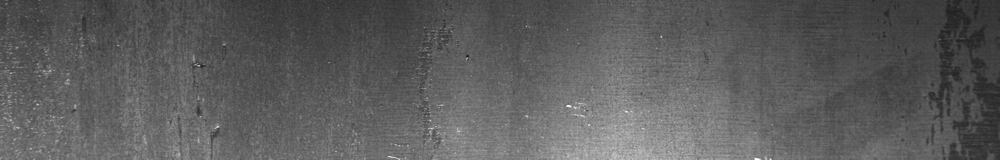

Image: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\0007a71bf_pred.png


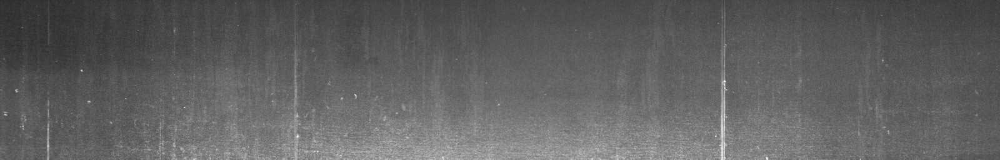

Image: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\000a4bcdd_pred.png


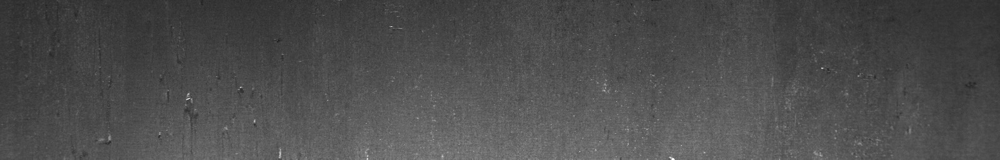

Image: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\000f6bf48_pred.png


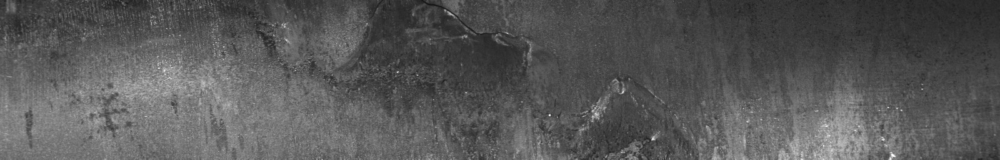

Image: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_cell\0014fce06_pred.png


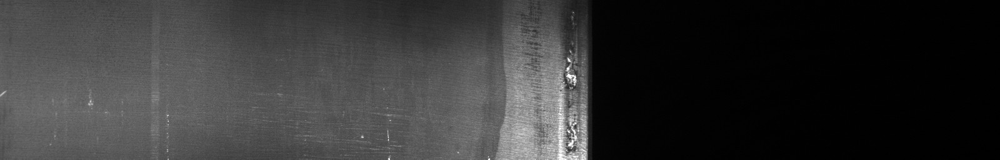

In [ ]:

from IPython.display import display

print("Displaying sample prediction images...\n")

for f in saved_files:
    print("Image:", os.path.abspath(f))
    img = Image.open(f)
    display(img)


In [ ]:


import torch

def iou_score(pred, true, threshold=0.5):
    """
    pred, true: tensors of shape (B, 1, H, W)
    """
    pred_bin = (pred > threshold).float()
    true_bin = (true > 0.5).float()
    
    intersection = (pred_bin * true_bin).sum(dim=(1,2,3))
    union = pred_bin.sum(dim=(1,2,3)) + true_bin.sum(dim=(1,2,3)) - intersection
    
    iou = (intersection + 1e-6) / (union + 1e-6)
    return iou.mean().item()

def dice_score(pred, true, threshold=0.5):
    pred_bin = (pred > threshold).float()
    true_bin = (true > 0.5).float()

    intersection = (pred_bin * true_bin).sum(dim=(1,2,3))
    dice = (2 * intersection + 1e-6) / (pred_bin.sum(dim=(1,2,3)) + true_bin.sum(dim=(1,2,3)) + 1e-6)

    return dice.mean().item()


In [ ]:

import pandas as pd
import numpy as np
import os
from PIL import Image
import torch

BASE_PATH = "D:\\Sk Khaleel\\YZU\\Pattern Recognition\\Final Project\\Dataset Several\\severstal-steel-defect-detection (1)\\"
CSV_PATH = os.path.join(BASE_PATH, "train.csv")
TRAIN_IMG_DIR = os.path.join(BASE_PATH, "train_images")

df = pd.read_csv(CSV_PATH)
print("CSV loaded. Columns:", df.columns.tolist())
print(df.head())


CSV loaded. Columns: ['ImageId', 'ClassId', 'EncodedPixels']
         ImageId  ClassId                                      EncodedPixels
0  0002cc93b.jpg        1  29102 12 29346 24 29602 24 29858 24 30114 24 3...
1  0007a71bf.jpg        3  18661 28 18863 82 19091 110 19347 110 19603 11...
2  000a4bcdd.jpg        1  37607 3 37858 8 38108 14 38359 20 38610 25 388...
3  000f6bf48.jpg        4  131973 1 132228 4 132483 6 132738 8 132993 11 ...
4  0014fce06.jpg        3  229501 11 229741 33 229981 55 230221 77 230468...


In [32]:
def rle_decode(mask_rle, shape=(1600, 256)):
    if pd.isna(mask_rle):
        return np.zeros((shape[1], shape[0]), dtype=np.uint8)
    s = mask_rle.split()
    starts = np.asarray(s[0::2], dtype=int)
    lengths = np.asarray(s[1::2], dtype=int)
    starts -= 1
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for st, le in zip(starts, lengths):
        img[st:st+le] = 1
    return img.reshape((shape[0],shape[1]), order='F').T

def ensure_jpg(name):
    if not isinstance(name, str):
        name = str(name)
    if name.lower().endswith(('.jpg','.jpeg','.png')):
        return name
    return name + ".jpg"


In [ ]:

import os
import pandas as pd
import numpy as np
from PIL import Image
import torch
from tqdm import tqdm   # <-- IMPORTANT (fixes your error)

print("Libraries imported successfully.")


Libraries imported successfully.


In [ ]:


def build_image_mask_map_from_image_class(df):
    """
    Handles CSV with columns: ImageId, ClassId, EncodedPixels
    Returns mapping: filename (with .jpg) -> combined mask (HxW 256x1600)
    """
    if not {'ImageId', 'EncodedPixels'}.issubset(set(df.columns)):
        raise ValueError("Expected columns 'ImageId' and 'EncodedPixels'. Columns found: " + str(df.columns.tolist()))
    
    mapping = {}
    
   
    grouped = df.groupby("ImageId")["EncodedPixels"].apply(list).to_dict()

    for img_id, rle_list in tqdm(grouped.items(), desc="Building masks"):
        fname = ensure_jpg(img_id)
        combined = None
        for rle in rle_list:
            if pd.isna(rle):
                continue
            mask = rle_decode(rle, shape=(1600, 256))
            combined = mask if combined is None else np.logical_or(combined, mask)
        
        if combined is None:
            combined = np.zeros((256,1600), dtype=np.uint8)
            
        mapping[fname] = combined.astype(np.uint8)

    return mapping


mapping = build_image_mask_map_from_image_class(df)
print("Mapping created. Total images:", len(mapping))
print("Sample keys:", list(mapping.keys())[:5])


Building masks: 100%|██████████| 6666/6666 [00:02<00:00, 2323.09it/s]

Mapping created. Total images: 6666
Sample keys: ['0002cc93b.jpg', '0007a71bf.jpg', '000a4bcdd.jpg', '000f6bf48.jpg', '0014fce06.jpg']


In [ ]:

import random
from torch.utils.data import DataLoader, Subset

VAL_FRACTION = 0.1   
MAX_VAL = 500        

total = len(ds)
val_count = int(total * VAL_FRACTION)
if MAX_VAL is not None:
    val_count = min(val_count, MAX_VAL)
indices = list(range(total))
random.seed(42)
random.shuffle(indices)

val_indices = indices[:val_count]
val_subset = Subset(ds, val_indices)
VAL_BATCH = 8

val_loader = DataLoader(val_subset, batch_size=VAL_BATCH, shuffle=False, num_workers=0)
print(f"Total samples: {total}  |  Validation samples: {len(val_subset)}  | batch size: {VAL_BATCH}")


Total samples: 6666  |  Validation samples: 500  | batch size: 8


In [ ]:

import torch

def binarize_pred(pred, thr=0.5):
    return (pred > thr).float()

def iou_batch(preds, trues, thr=0.5, eps=1e-6):
    """preds, trues: tensors (B,1,H,W) on same device"""
    p = binarize_pred(preds, thr)
    t = (trues > 0.5).float()
    intersection = (p * t).sum(dim=(1,2,3))
    union = p.sum(dim=(1,2,3)) + t.sum(dim=(1,2,3)) - intersection
    iou = (intersection + eps) / (union + eps)
    return iou  

def dice_batch(preds, trues, thr=0.5, eps=1e-6):
    p = binarize_pred(preds, thr)
    t = (trues > 0.5).float()
    intersection = (p * t).sum(dim=(1,2,3))
    denom = p.sum(dim=(1,2,3)) + t.sum(dim=(1,2,3))
    dice = (2 * intersection + eps) / (denom + eps)
    return dice

def pixel_accuracy_batch(preds, trues, thr=0.5):
    p = binarize_pred(preds, thr)
    t = (trues > 0.5).float()
    correct = (p == t).float().sum(dim=(1,2,3))
    total = torch.tensor([preds.shape[2] * preds.shape[3]], dtype=torch.float, device=preds.device)
    total = total * preds.shape[0]  
    
    per_total = preds.shape[2] * preds.shape[3]
    per_acc = (p == t).float().sum(dim=(2,3)) / per_total  
    return per_acc.squeeze(1)  


In [ ]:

import os, math, pandas as pd
from tqdm import tqdm

model.eval()
results = []  

with torch.no_grad():
    for batch in tqdm(val_loader, desc="Evaluating"):
        imgs, masks, ids = batch 
        imgs = imgs.to(DEVICE)
        masks = masks.to(DEVICE)

        preds = model(imgs)  

        ious = iou_batch(preds, masks)         
        dices = dice_batch(preds, masks)       
        accs = pixel_accuracy_batch(preds, masks)  

        
        for k in range(preds.shape[0]):
            results.append({
                "image_id": ids[k],
                "iou": float(ious[k].cpu().item()),
                "dice": float(dices[k].cpu().item()),
                "pixel_acc": float(accs[k].cpu().item())
            })


out_csv = "metrics_val.csv"
pd.DataFrame(results).to_csv(out_csv, index=False)
print("Saved per-image metrics to:", os.path.abspath(out_csv))
print("Number of evaluated images:", len(results))


Evaluating: 100%|██████████| 63/63 [00:18<00:00,  3.45it/s]

Saved per-image metrics to: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\metrics_val.csv
Number of evaluated images: 500


In [ ]:

dfm = pd.read_csv("metrics_val.csv")
def stats(col):
    return dfm[col].mean(), dfm[col].std(), dfm[col].min(), dfm[col].max()

for c in ["iou","dice","pixel_acc"]:
    mn, sd, mnv, mx = stats(c)
    print(f"{c.upper():7s}: mean={mn:.4f}  std={sd:.4f}  min={mnv:.4f}  max={mx:.4f}")


thr = 0.5
pct_above = (dfm["iou"] > thr).mean() * 100
print(f"\nPercentage of val images with IoU > {thr}: {pct_above:.2f}%")


IOU    : mean=0.0000  std=0.0000  min=0.0000  max=0.0000
DICE   : mean=0.0000  std=0.0000  min=0.0000  max=0.0000
PIXEL_ACC: mean=0.9357  std=0.0913  min=0.4051  max=0.9998

Percentage of val images with IoU > 0.5: 0.00%


In [39]:
!pip install matplotlib



[notice] A new release of pip is available: 23.2.1 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Worst examples:
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\worst_d535c41bf_pred.png


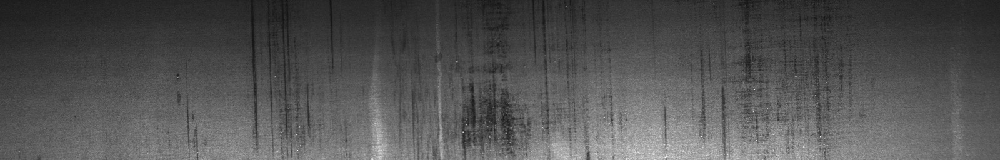

Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\worst_a5b23c751_pred.png


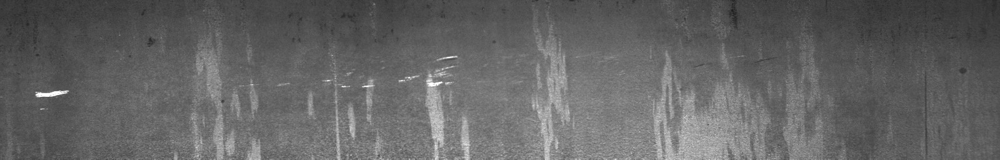

Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\worst_ea168de6c_pred.png


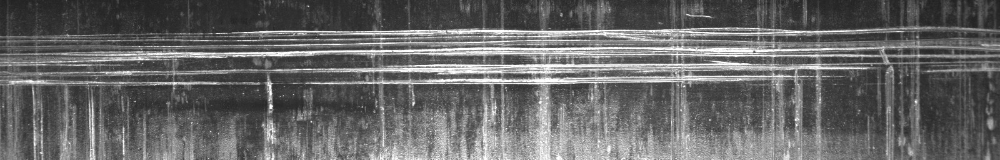


Best examples:
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\best_42996bbcf_pred.png


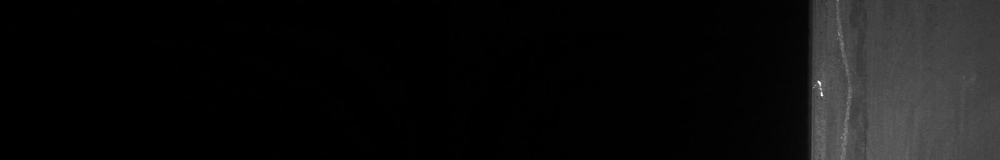

Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\best_a56df9123_pred.png


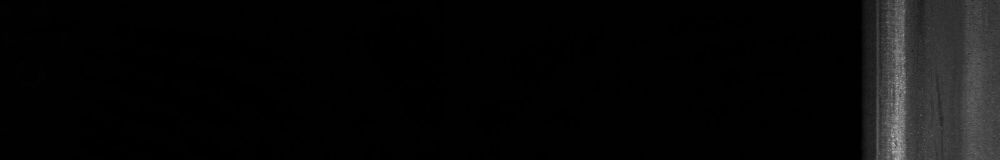

Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\best_f294b84ed_pred.png


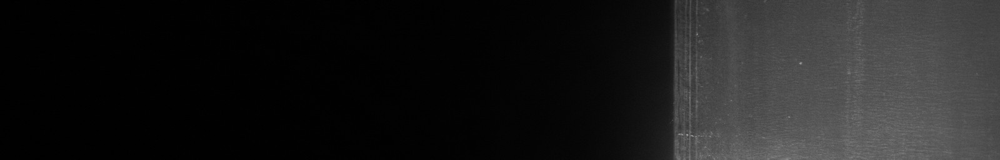

In [ ]:

from PIL import Image
import numpy as np
import os
from IPython.display import display

dfm = pd.read_csv("metrics_val.csv")
dfm_sorted = dfm.sort_values("iou")

K = 3  
worst = dfm_sorted.head(K)
best  = dfm_sorted.tail(K)

out_dir = "predictions_val"
os.makedirs(out_dir, exist_ok=True)

def make_overlay_and_display(img_id, prefix):
   
    possible = [
        os.path.join(TRAIN_IMG_DIR, img_id),
        os.path.join(TRAIN_IMG_DIR, os.path.splitext(img_id)[0] + ".jpg"),
        os.path.join(TRAIN_IMG_DIR, os.path.splitext(img_id)[0] + ".png")
    ]
    orig_path = next((p for p in possible if os.path.exists(p)), None)
    if orig_path is None:
        print("Image not found:", img_id)
        return

    orig = Image.open(orig_path).convert("RGB")

   
    try:
        idx = ds.ids.index(img_id)
    except:
        idx = ds.ids.index(os.path.basename(img_id))

    img_t, mask_t, _ = ds[idx]
    with torch.no_grad():
        pred = model(img_t.unsqueeze(0).to(DEVICE))[0,0].cpu().numpy()
    
    pred_resized = Image.fromarray((pred * 255).astype(np.uint8)).resize(orig.size)
    mask_overlay = pred_resized.point(lambda p: 255 if p > 50 else 0).convert("L")

   
    red_overlay = Image.new("RGBA", orig.size, (255, 0, 0, 120))
    overlay_rgba = Image.composite(red_overlay, Image.new("RGBA", orig.size), mask_overlay)
    blended = Image.alpha_composite(orig.convert("RGBA"), overlay_rgba)

    out_path = os.path.join(out_dir, f"{prefix}_{os.path.splitext(img_id)[0]}_pred.png")
    blended.save(out_path)

    print("Saved:", os.path.abspath(out_path))
    display(blended)  


print("Worst examples:")
for _, row in worst.iterrows():
    make_overlay_and_display(row["image_id"], "worst")

print("\nBest examples:")
for _, row in best.iterrows():
    make_overlay_and_display(row["image_id"], "best")

DEVICE = cuda
BASE_PATH = D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\
CSV_PATH = D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train.csv
TRAIN_IMG_DIR = D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images

Loading CSV and building mask mapping (this can take a minute)...
CSV columns: ['ImageId', 'ClassId', 'EncodedPixels']


Building masks: 100%|██████████| 6666/6666 [00:03<00:00, 1787.74it/s]
C:\Users\shaik\AppData\Local\Temp\ipykernel_14288\4219407906.py:204: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental

Mapping built for 6666 images.
Dataset total: 6666, Validation count: 500, Batch size: 8
Loaded model weights from d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\steel_unet_final.pth

Evaluating on validation set...


Validate: 100%|██████████| 63/63 [00:18<00:00,  3.49it/s]



Saved metrics CSV to: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\metrics_val.csv
Evaluated images: 500

Summary statistics:
IOU     mean=0.0000  std=0.0000  min=0.0000  max=0.0000
DICE    mean=0.0000  std=0.0000  min=0.0000  max=0.0000
PIXEL_ACC mean=0.9357  std=0.0913  min=0.4051  max=0.9998

Percentage of val images with IoU > 0.5: 0.00%

Creating overlay PNGs for best/worst examples (saved to predictions_dir)...

Worst examples:
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\worst_d535c41bf_pred.png
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\worst_a5b23c751_pred.png
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\worst_ea168de6c_pred.png

Best examples:
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\best_42996bbcf_pred.png
Saved: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\

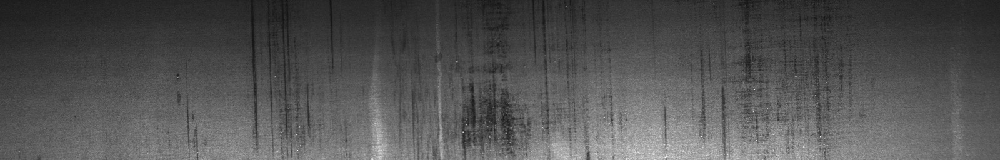

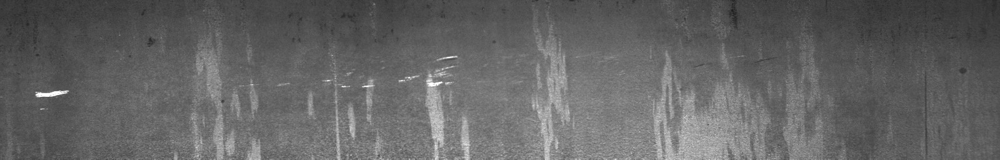

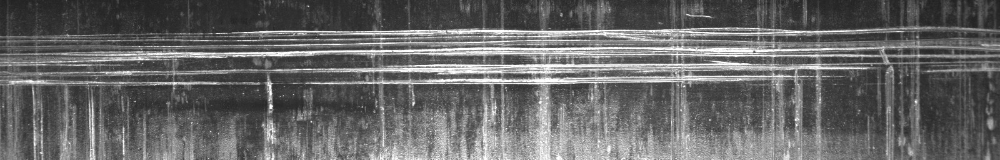

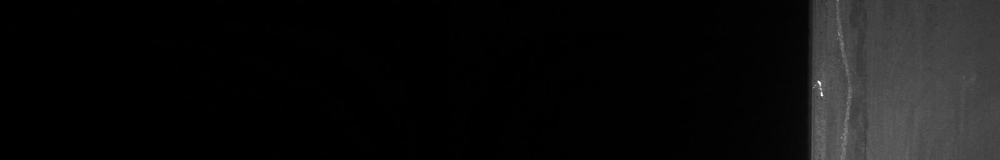

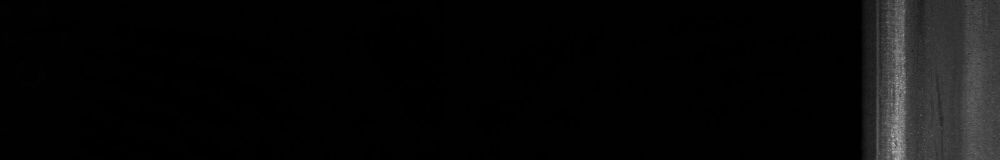

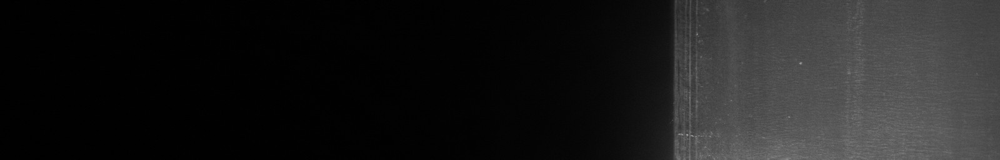


WEEK 4 COMPLETE. Metrics CSV and overlay PNGs are ready.


In [ ]:

import os
import sys
import math
import random
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm


import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset


BASE_PATH = "D:\\Sk Khaleel\\YZU\\Pattern Recognition\\Final Project\\Dataset Several\\severstal-steel-defect-detection (1)\\"
CSV_PATH = os.path.join(BASE_PATH, "train.csv")
TRAIN_IMG_DIR = os.path.join(BASE_PATH, "train_images")

TEST_IMG_DIR = os.path.join(BASE_PATH, "test_images")

MODEL_WEIGHTS = "steel_unet_final.pth" 
OUTPUT_METRICS_CSV = "metrics_val.csv"
PREDICTIONS_OUT_DIR = "predictions_val"

IMG_SIZE = (256, 256)   
VAL_FRACTION = 0.1      
MAX_VAL = 500           
BATCH_SIZE = 8
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print("DEVICE =", DEVICE)
print("BASE_PATH =", BASE_PATH)
print("CSV_PATH =", CSV_PATH)
print("TRAIN_IMG_DIR =", TRAIN_IMG_DIR)


if not os.path.exists(CSV_PATH):
    raise FileNotFoundError(f"train.csv not found at {CSV_PATH}")
if not os.path.exists(TRAIN_IMG_DIR):
    raise FileNotFoundError(f"train_images folder not found at {TRAIN_IMG_DIR}")


def rle_decode(mask_rle, shape=(1600, 256)):
    """Decode RLE (Kaggle/Severstal) to binary mask HxW (256 x 1600)"""
    if pd.isna(mask_rle):
        return np.zeros((shape[1], shape[0]), dtype=np.uint8)
    s = str(mask_rle).strip().split()
    starts = np.asarray(s[0::2], dtype=int)
    lengths = np.asarray(s[1::2], dtype=int)
    starts -= 1
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for st, le in zip(starts, lengths):
        img[st:st+le] = 1
    return img.reshape((shape[0], shape[1]), order='F').T  

def ensure_jpg(name):
    if not isinstance(name, str):
        name = str(name)
    if name.lower().endswith(('.jpg', '.jpeg', '.png')):
        return name
    return name + ".jpg"


print("\nLoading CSV and building mask mapping (this can take a minute)...")
df = pd.read_csv(CSV_PATH)
print("CSV columns:", df.columns.tolist())

if not {'ImageId', 'EncodedPixels'}.issubset(set(df.columns)):
    raise ValueError("CSV doesn't contain expected 'ImageId' and 'EncodedPixels' columns. Columns found: " + str(df.columns.tolist()))

grouped = df.groupby("ImageId")["EncodedPixels"].apply(list).to_dict()
mapping = {}
for img_id, rle_list in tqdm(grouped.items(), desc="Building masks"):
    fname = ensure_jpg(img_id)
    combined = None
    for rle in rle_list:
        if pd.isna(rle):
            continue
        mask = rle_decode(rle, shape=(1600,256))  
        combined = mask if combined is None else np.logical_or(combined, mask)
    if combined is None:
        combined = np.zeros((256,1600), dtype=np.uint8)
    mapping[fname] = combined.astype(np.uint8)

print("Mapping built for", len(mapping), "images.")


class SeverstalDatasetPIL(Dataset):
    def __init__(self, img_dir, mapping, img_size=(256,256)):
        self.img_dir = img_dir
        self.mapping = mapping
        self.ids = list(mapping.keys())
        self.img_size = img_size

    def __len__(self):
        return len(self.ids)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
       
        img_path = os.path.join(self.img_dir, img_id)
        if not os.path.exists(img_path):
            base = os.path.splitext(img_id)[0]
            found = False
            for ext in ('.jpg', '.jpeg', '.png'):
                p = os.path.join(self.img_dir, base + ext)
                if os.path.exists(p):
                    img_path = p
                    found = True
                    break
            if not found:
                raise FileNotFoundError(f"Image not found: tried {img_path} and extensions")

        img = Image.open(img_path).convert('RGB')
        img_resized = img.resize((self.img_size[1], self.img_size[0]))
        img_arr = np.asarray(img_resized).astype(np.float32) / 255.0
        img_tensor = np.transpose(img_arr, (2,0,1)).astype(np.float32)  # C,H,W

        mask_orig = self.mapping[os.path.basename(img_path)]
        mask_resized = Image.fromarray(mask_orig).resize((self.img_size[1], self.img_size[0]))
        mask_arr = (np.asarray(mask_resized) > 0).astype(np.float32)
        mask_tensor = mask_arr[np.newaxis, :, :].astype(np.float32)

        return torch.tensor(img_tensor), torch.tensor(mask_tensor), os.path.basename(img_path)


dataset = SeverstalDatasetPIL(TRAIN_IMG_DIR, mapping, img_size=IMG_SIZE)
total = len(dataset)
val_count = int(total * VAL_FRACTION)
if MAX_VAL is not None:
    val_count = min(val_count, MAX_VAL)
indices = list(range(total))
random.seed(42)
random.shuffle(indices)
val_indices = indices[:val_count]
val_subset = Subset(dataset, val_indices)
val_loader = DataLoader(val_subset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
print(f"Dataset total: {total}, Validation count: {len(val_subset)}, Batch size: {BATCH_SIZE}")


class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
        )
    def forward(self,x): return self.net(x)

class UNet(nn.Module):
    def __init__(self, in_ch=3, out_ch=1):
        super().__init__()
        self.down1 = DoubleConv(in_ch,64); self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(64,128); self.pool2 = nn.MaxPool2d(2)
        self.down3 = DoubleConv(128,256); self.pool3 = nn.MaxPool2d(2)
        self.bridge = DoubleConv(256,512)
        self.up3 = nn.ConvTranspose2d(512,256,2,stride=2); self.conv3 = DoubleConv(512,256)
        self.up2 = nn.ConvTranspose2d(256,128,2,stride=2); self.conv2 = DoubleConv(256,128)
        self.up1 = nn.ConvTranspose2d(128,64,2,stride=2); self.conv1 = DoubleConv(128,64)
        self.out = nn.Conv2d(64,out_ch,1)
    def forward(self,x):
        d1 = self.down1(x); p1 = self.pool1(d1)
        d2 = self.down2(p1); p2 = self.pool2(d2)
        d3 = self.down3(p2); p3 = self.pool3(d3)
        b  = self.bridge(p3)
        u3 = self.up3(b); u3 = torch.cat([u3,d3], dim=1); c3 = self.conv3(u3)
        u2 = self.up2(c3); u2 = torch.cat([u2,d2], dim=1); c2 = self.conv2(u2)
        u1 = self.up1(c2); u1 = torch.cat([u1,d1], dim=1); c1 = self.conv1(u1)
        return torch.sigmoid(self.out(c1))


model = UNet().to(DEVICE)
if os.path.exists(MODEL_WEIGHTS):
    try:
        model.load_state_dict(torch.load(MODEL_WEIGHTS, map_location=DEVICE))
        print("Loaded model weights from", os.path.abspath(MODEL_WEIGHTS))
    except Exception as e:
        print("Failed to load model weights:", e)
        print("Continuing with randomly initialized model (metrics will be meaningless).")
else:
    print("Model weights file not found at", MODEL_WEIGHTS)
    print("If you already trained a model, set MODEL_WEIGHTS variable to point to the .pth file.")


def binarize(pred, thr=0.5):
    return (pred > thr).float()

def iou_batch(preds, trues, thr=0.5, eps=1e-6):
    p = binarize(preds, thr)
    t = (trues > 0.5).float()
    intersection = (p * t).sum(dim=(1,2,3))
    union = p.sum(dim=(1,2,3)) + t.sum(dim=(1,2,3)) - intersection
    iou = (intersection + eps) / (union + eps)
    return iou.cpu().numpy()

def dice_batch(preds, trues, thr=0.5, eps=1e-6):
    p = binarize(preds, thr)
    t = (trues > 0.5).float()
    intersection = (p * t).sum(dim=(1,2,3))
    denom = p.sum(dim=(1,2,3)) + t.sum(dim=(1,2,3))
    dice = (2 * intersection + eps) / (denom + eps)
    return dice.cpu().numpy()

def pixel_acc_batch(preds, trues, thr=0.5):
    p = binarize(preds, thr)
    t = (trues > 0.5).float()
    per_image_total = preds.shape[2] * preds.shape[3]
    correct = (p == t).float().sum(dim=(2,3)).squeeze(1) 
    acc = (correct / per_image_total).cpu().numpy()
    return acc


print("\nEvaluating on validation set...")
model.eval()
results = []
with torch.no_grad():
    for batch in tqdm(val_loader, desc="Validate"):
        imgs, masks, ids = batch
        imgs = imgs.to(DEVICE).float()
        masks = masks.to(DEVICE).float()

        preds = model(imgs) 

        ious = iou_batch(preds, masks)
        dices = dice_batch(preds, masks)
        accs = pixel_acc_batch(preds, masks)

        for k in range(len(ids)):
            results.append({
                "image_id": ids[k],
                "iou": float(ious[k]),
                "dice": float(dices[k]),
                "pixel_acc": float(accs[k])
            })


pd.DataFrame(results).to_csv(OUTPUT_METRICS_CSV, index=False)
print("\nSaved metrics CSV to:", os.path.abspath(OUTPUT_METRICS_CSV))
print("Evaluated images:", len(results))


if len(results) > 0:
    dfm = pd.DataFrame(results)
    print("\nSummary statistics:")
    for col in ["iou","dice","pixel_acc"]:
        print(f"{col.upper():7s} mean={dfm[col].mean():.4f}  std={dfm[col].std():.4f}  min={dfm[col].min():.4f}  max={dfm[col].max():.4f}")
    thr = 0.5
    pct = (dfm["iou"] > thr).mean() * 100
    print(f"\nPercentage of val images with IoU > {thr}: {pct:.2f}%")
else:
    print("No evaluation results (empty).")

print("\nCreating overlay PNGs for best/worst examples (saved to predictions_dir)...")
os.makedirs(PREDICTIONS_OUT_DIR, exist_ok=True)

if len(results) > 0:
    dfm_sorted = dfm.sort_values("iou")
    K = 3
    worst = dfm_sorted.head(K)
    best = dfm_sorted.tail(K)

    def make_and_save_overlay(img_id, prefix):
      
        possible = [
            os.path.join(TRAIN_IMG_DIR, img_id),
            os.path.join(TRAIN_IMG_DIR, os.path.splitext(img_id)[0] + ".jpg"),
            os.path.join(TRAIN_IMG_DIR, os.path.splitext(img_id)[0] + ".png")
        ]
        orig_path = next((p for p in possible if os.path.exists(p)), None)
        if orig_path is None:
            print("Image not found on disk:", img_id)
            return None
        orig = Image.open(orig_path).convert("RGB")
       
        try:
            idx = dataset.ids.index(img_id)
        except ValueError:
       
            idx = dataset.ids.index(os.path.basename(img_id))
        img_t, mask_t, _ = dataset[idx]
        with torch.no_grad():
            pred = model(img_t.unsqueeze(0).to(DEVICE))[0,0].cpu().numpy()
        pred_resized = Image.fromarray((pred * 255).astype(np.uint8)).resize(orig.size)
        mask_overlay = pred_resized.point(lambda p: 255 if p > 50 else 0).convert("L")
        red_overlay = Image.new("RGBA", orig.size, (255,0,0,120))
        overlay_rgba = Image.composite(red_overlay, Image.new("RGBA", orig.size), mask_overlay)
        blended = Image.alpha_composite(orig.convert("RGBA"), overlay_rgba)
        out_name = f"{prefix}_{os.path.splitext(img_id)[0]}_pred.png"
        out_path = os.path.join(PREDICTIONS_OUT_DIR, out_name)
        blended.save(out_path)
        return out_path

    saved_paths = []
    print("\nWorst examples:")
    for _, row in worst.iterrows():
        p = make_and_save_overlay(row["image_id"], "worst")
        if p:
            print("Saved:", os.path.abspath(p))
            saved_paths.append(p)

    print("\nBest examples:")
    for _, row in best.iterrows():
        p = make_and_save_overlay(row["image_id"], "best")
        if p:
            print("Saved:", os.path.abspath(p))
            saved_paths.append(p)

    print("\nAll overlay images saved to:", os.path.abspath(PREDICTIONS_OUT_DIR))
else:
    print("No best/worst overlays created (no results).")


try:
    from IPython.display import display
    if saved_paths:
        print("\nDisplaying sample overlay images (if notebook):")
        for p in saved_paths[:6]:
            display(Image.open(p))
except Exception:
    pass

print("\nWEEK 4 COMPLETE. Metrics CSV and overlay PNGs are ready.")


In [ ]:

import os

print("Original TRAIN images folder:")
print(os.path.abspath(TRAIN_IMG_DIR))


Original TRAIN images folder:
D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images


In [ ]:

image_files = os.listdir(TRAIN_IMG_DIR)

print("Total original images:", len(image_files))
print("Sample original image filenames:")
for f in image_files[:10]:
    print(" -", f)


Total original images: 12568
Sample original image filenames:
 - 0002cc93b.jpg
 - 00031f466.jpg
 - 000418bfc.jpg
 - 000789191.jpg
 - 0007a71bf.jpg
 - 000a4bcdd.jpg
 - 000f6bf48.jpg
 - 0014fce06.jpg
 - 001982b08.jpg
 - 001d1b355.jpg


Displaying original dataset images:

Original image path: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images\0002cc93b.jpg


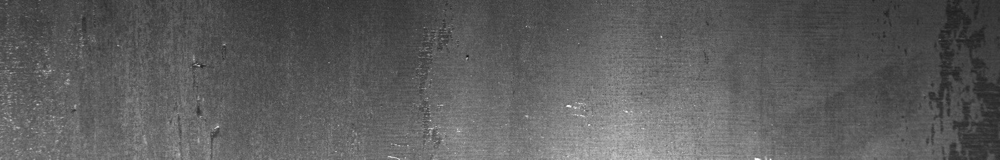

Original image path: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images\00031f466.jpg


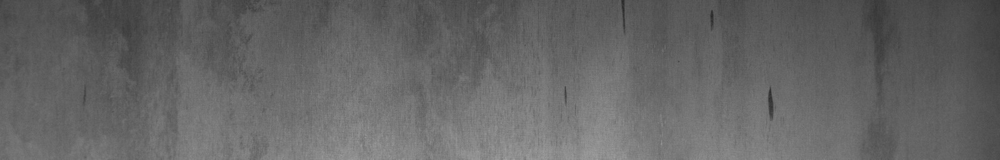

Original image path: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images\000418bfc.jpg


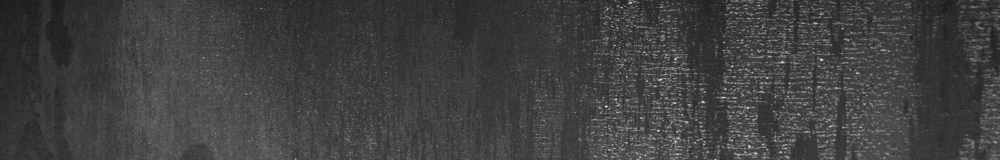

Original image path: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images\000789191.jpg


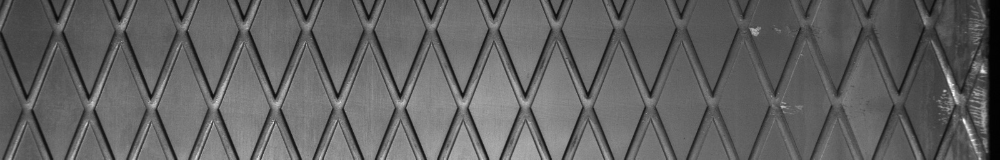

Original image path: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images\0007a71bf.jpg


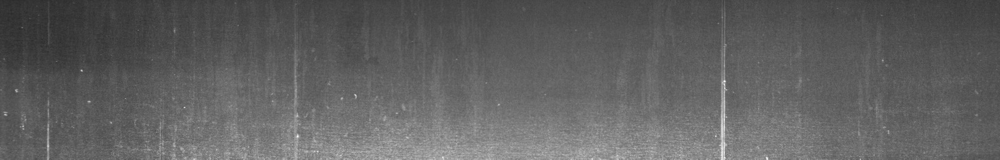

In [ ]:

from PIL import Image
from IPython.display import display

print("Displaying original dataset images:\n")

for img_name in image_files[:5]: 
    img_path = os.path.join(TRAIN_IMG_DIR, img_name)
    print("Original image path:", os.path.abspath(img_path))
    img = Image.open(img_path)
    display(img)


Original (left) vs Predicted Overlay (right):

Original: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images\42996bbcf.jpg
Prediction: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\best_42996bbcf_pred.png


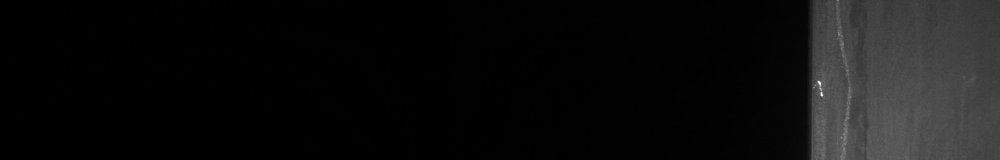

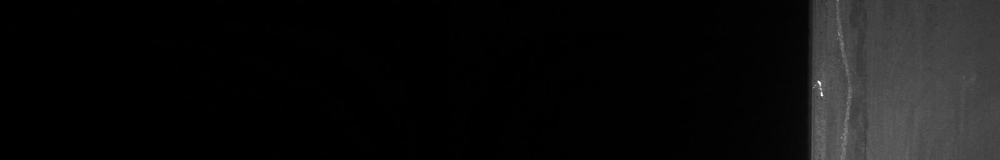

Original: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images\a56df9123.jpg
Prediction: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\best_a56df9123_pred.png


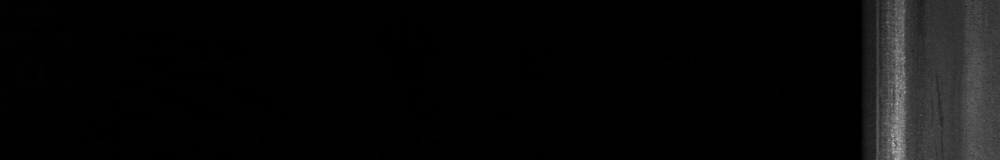

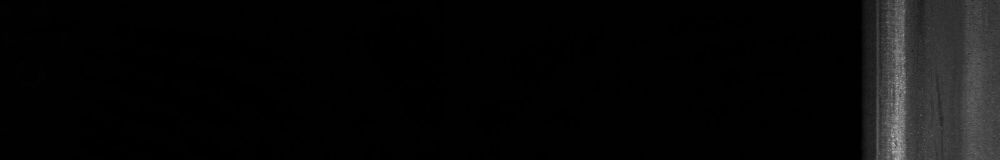

Original: D:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\severstal-steel-defect-detection (1)\train_images\f294b84ed.jpg
Prediction: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\predictions_val\best_f294b84ed_pred.png


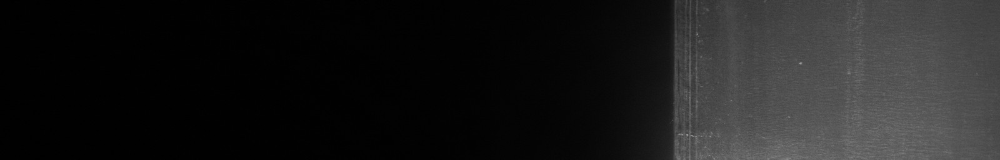

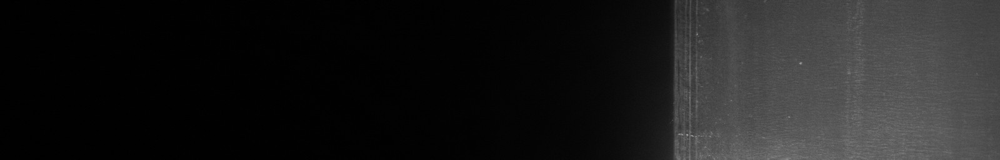

In [ ]:

from PIL import Image
from IPython.display import display

print("Original (left) vs Predicted Overlay (right):\n")

for p in os.listdir("predictions_val")[:3]:
    pred_path = os.path.join("predictions_val", p)

  
    base_name = p.replace("best_", "").replace("worst_", "").replace("_pred.png", "")
    orig_candidates = [
        os.path.join(TRAIN_IMG_DIR, base_name + ".jpg"),
        os.path.join(TRAIN_IMG_DIR, base_name + ".png")
    ]
    orig_path = next((x for x in orig_candidates if os.path.exists(x)), None)

    if orig_path is None:
        continue

    print("Original:", os.path.abspath(orig_path))
    print("Prediction:", os.path.abspath(pred_path))

    display(Image.open(orig_path))
    display(Image.open(pred_path))


In [46]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch


In [ ]:


def soft_iou(pred, gt, eps=1e-6):
    inter = (pred * gt).sum()
    union = pred.sum() + gt.sum() - inter
    return (inter + eps) / (union + eps)

def soft_dice(pred, gt, eps=1e-6):
    inter = (pred * gt).sum()
    return (2 * inter + eps) / (pred.sum() + gt.sum() + eps)


In [ ]:


results = []

model.eval()
with torch.no_grad():
    for img, mask, img_id in val_loader:
        img = img.to(DEVICE)
        mask = mask.to(DEVICE)
        pred = model(img)

        for i in range(len(img_id)):
            results.append({
                "image_id": img_id[i],
                "iou": soft_iou(pred[i], mask[i]).item(),
                "dice": soft_dice(pred[i], mask[i]).item()
            })

df = pd.DataFrame(results)
df.to_csv("metrics_val.csv", index=False)

print("metrics_val.csv regenerated")
print("Mean IoU :", df["iou"].mean())
print("Mean Dice:", df["dice"].mean())


metrics_val.csv regenerated
Mean IoU : 0.023948633138264994
Mean Dice: 0.046242121404735374


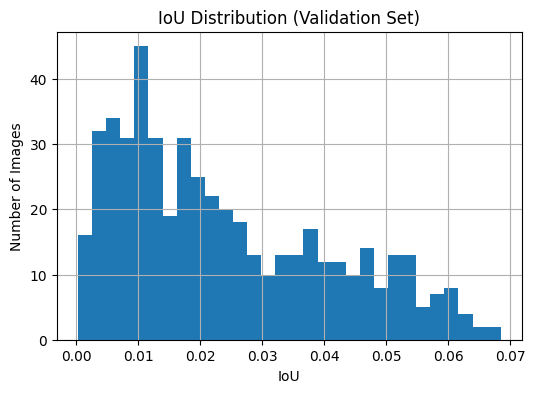

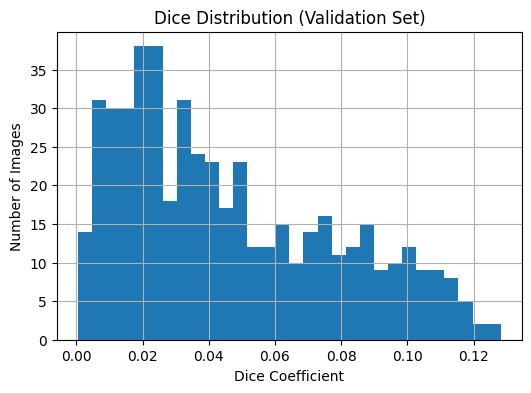

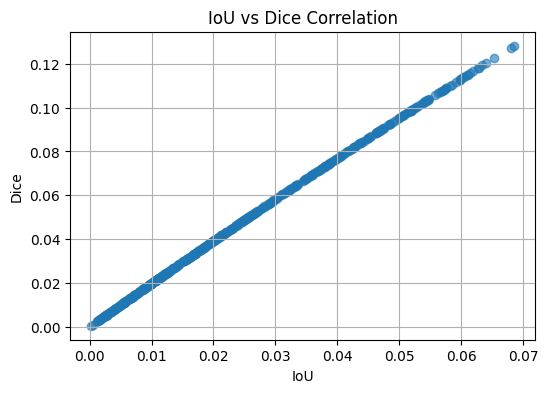


===== WEEK 5 PLOTS GENERATED =====
Mean IoU : 0.023948633138264945
Mean Dice: 0.046242121404735326
Plots saved in: d:\Sk Khaleel\YZU\Pattern Recognition\Final Project\Dataset Several\week5_plots


In [ ]:


OUT_DIR = "week5_plots"
os.makedirs(OUT_DIR, exist_ok=True)

# ---- IoU Distribution ----
plt.figure(figsize=(6,4))
plt.hist(df["iou"], bins=30)
plt.xlabel("IoU")
plt.ylabel("Number of Images")
plt.title("IoU Distribution (Validation Set)")
plt.grid(True)
plt.savefig(os.path.join(OUT_DIR, "iou_distribution.png"))
plt.show()

# ---- Dice Distribution ----
plt.figure(figsize=(6,4))
plt.hist(df["dice"], bins=30)
plt.xlabel("Dice Coefficient")
plt.ylabel("Number of Images")
plt.title("Dice Distribution (Validation Set)")
plt.grid(True)
plt.savefig(os.path.join(OUT_DIR, "dice_distribution.png"))
plt.show()

# ---- IoU vs Dice ----
plt.figure(figsize=(6,4))
plt.scatter(df["iou"], df["dice"], alpha=0.6)
plt.xlabel("IoU")
plt.ylabel("Dice")
plt.title("IoU vs Dice Correlation")
plt.grid(True)
plt.savefig(os.path.join(OUT_DIR, "iou_vs_dice.png"))
plt.show()

print("\n===== WEEK 5 PLOTS GENERATED =====")
print("Mean IoU :", df['iou'].mean())
print("Mean Dice:", df['dice'].mean())
print("Plots saved in:", os.path.abspath(OUT_DIR))


In [ ]:
import pandas as pd

df = pd.read_csv("metrics_val.csv")


worst_cases = df.sort_values("iou").head(5)
best_cases  = df.sort_values("iou", ascending=False).head(5)

print("Worst cases:")
print(worst_cases)

print("\nBest cases:")
print(best_cases)


Worst cases:
          image_id       iou      dice
306  f294b84ed.jpg  0.000250  0.000500
363  a56df9123.jpg  0.000478  0.000956
51   42996bbcf.jpg  0.001222  0.002440
24   3dffc3010.jpg  0.001374  0.002744
408  78c25510b.jpg  0.001382  0.002761

Best cases:
          image_id       iou      dice
426  d535c41bf.jpg  0.068501  0.128219
432  ea168de6c.jpg  0.067955  0.127262
434  8248c9b1d.jpg  0.065269  0.122539
10   2e5dab72b.jpg  0.063958  0.120227
482  e3988634c.jpg  0.063399  0.119238


In [51]:
import matplotlib.pyplot as plt
from PIL import Image
import torch
import numpy as np

def show_failure(img_id):
    img_path = os.path.join(TRAIN_IMG_DIR, img_id)

    img = Image.open(img_path).convert("RGB")
    img_resized = img.resize((256,256))
    img_tensor = torch.tensor(
        np.transpose(np.asarray(img_resized)/255.0, (2,0,1)),
        dtype=torch.float32
    ).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        pred = model(img_tensor)[0,0].cpu().numpy()

    gt = mapping[img_id]
    gt = np.array(Image.fromarray(gt).resize((256,256)))

    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_resized)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(gt, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred, cmap="hot")
    plt.title("Predicted Probability Map")
    plt.axis("off")

    plt.show()


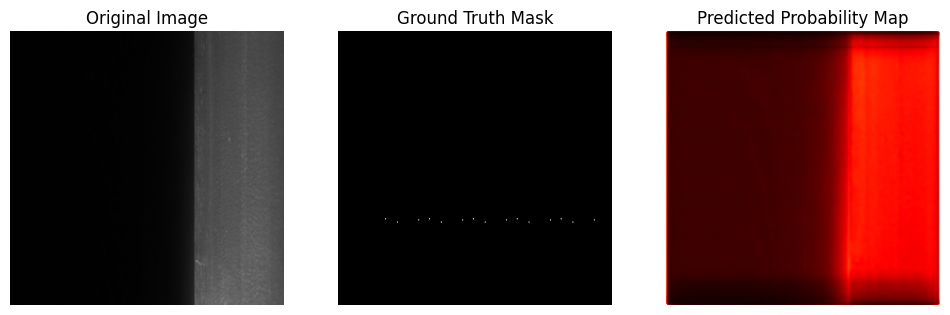

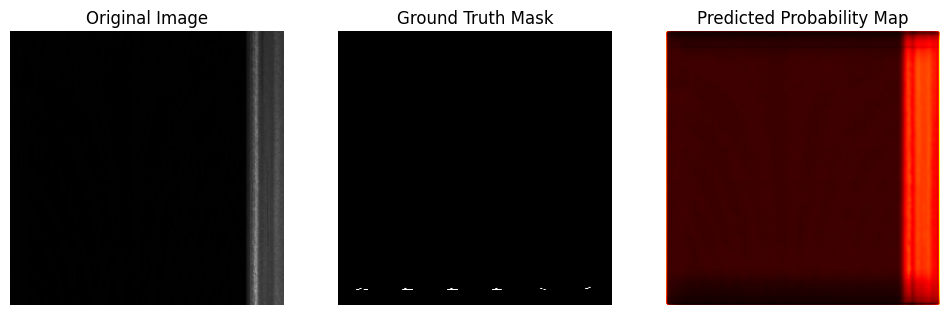

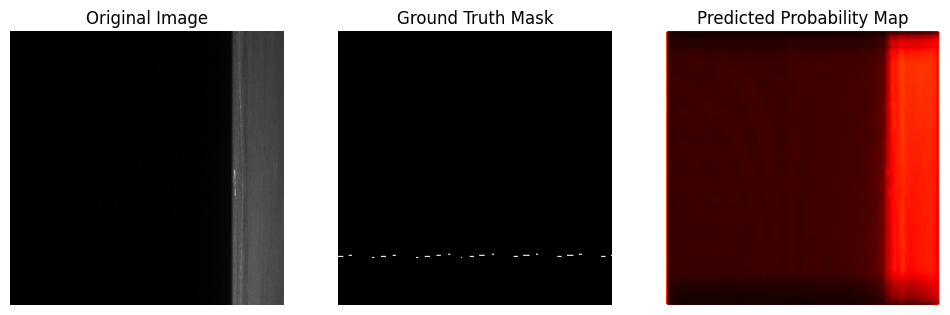

In [52]:
for img_id in worst_cases["image_id"][:3]:
    show_failure(img_id)


In [53]:
print("Worst IoU values:")
print(worst_cases[["image_id", "iou", "dice"]])


Worst IoU values:
          image_id       iou      dice
306  f294b84ed.jpg  0.000250  0.000500
363  a56df9123.jpg  0.000478  0.000956
51   42996bbcf.jpg  0.001222  0.002440
24   3dffc3010.jpg  0.001374  0.002744
408  78c25510b.jpg  0.001382  0.002761
